# Homework 3

#### Sitong Ju
#### USC ID: 8791155953
#### email: sitongju@usc.edu

In [1]:
import csv
import re
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LogisticRegressionCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from IPython.display import Image

import warnings
warnings.filterwarnings('ignore')

### 1. Time series classification
### (a) download, clean and import data

In [2]:
files_list = glob.glob('../data/AReM/*/*.csv')
files_list = sorted(files_list)
files_list[:10]

['../data/AReM/bending1/dataset1.csv',
 '../data/AReM/bending1/dataset2.csv',
 '../data/AReM/bending1/dataset3.csv',
 '../data/AReM/bending1/dataset4.csv',
 '../data/AReM/bending1/dataset5.csv',
 '../data/AReM/bending1/dataset6.csv',
 '../data/AReM/bending1/dataset7.csv',
 '../data/AReM/bending2/dataset1.csv',
 '../data/AReM/bending2/dataset2.csv',
 '../data/AReM/bending2/dataset3.csv']

### (b) Split train and test dataset

### just split the locations for now, will split in the data later

In [3]:
test_index = [0, 1, 7, 8, 13, 20, 21, 28, 35, 36, 43, 50, 51, 58, 65, 66, 73, 80, 81]
test_dataloc = []
train_dataloc = []
for i in range (len(files_list)):
    if i in test_index:
        test_dataloc.append(files_list[i])
    else:
        train_dataloc.append(files_list[i])

### (c)(i) Time-domain features are usually used in time series classification: minimum, maximum, mean, standard deviation, quantiles, first and last locations of minimum/maximum, peaks number, skewness, etc.

### (c)(ii) Extract the time-domain features minimum, maximum, mean, median, standard deviation, first quartile, and third quartile for all of the 6 time series in each instance.

In [4]:
first_file = pd.read_csv(files_list[0], skiprows = 4, usecols = [1,2,3,4,5,6])
first_file_stats= first_file.describe()

first_file_stats.columns = [1,2,3,4,5,6]
first_file_stats

,1,2,3,4,5,6
count,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000
mean,40.624792,0.358604,19.040937,0.832542,34.311292,0.570583
std,1.476967,0.322605,4.462952,0.965659,2.188449,0.582915
min,37.250000,0.000000,4.000000,0.000000,27.250000,0.000000
25%,39.250000,0.000000,16.000000,0.000000,33.000000,0.000000
50%,40.500000,0.430000,19.250000,0.500000,35.000000,0.430000
75%,42.000000,0.500000,23.250000,1.120000,36.000000,1.300000
max,45.000000,1.300000,29.500000,7.230000,38.250000,1.920000


In [5]:
col_names = []
for i in range(1,7):
    col_names.append('min'+ str(i))
    col_names.append('max'+ str(i))
    col_names.append('mean'+ str(i))
    col_names.append('median'+ str(i))
    col_names.append('std'+ str(i))
    col_names.append('1st_quart'+ str(i))
    col_names.append('3rd_quart'+ str(i))

In [6]:
df_c_ii = pd.DataFrame(columns = col_names)
for fileloc in files_list:
    file = pd.read_csv(fileloc, skiprows = 4, usecols = [1,2,3,4,5,6])
    stats = file.describe()
    stats.columns = [1,2,3,4,5,6]
    row = []
    for i in range(1,7):
        row.append(stats[i][3])
        row.append(stats[i][7])
        row.append(stats[i][1])
        row.append(stats[i][5])
        row.append(stats[i][2])
        row.append(stats[i][4])
        row.append(stats[i][6])
    dfrow = pd.DataFrame(row).to_numpy().reshape(1, 42)
    df_c_ii = df_c_ii.append(pd.DataFrame(dfrow, columns = col_names)).reset_index(drop = True)
df_c_ii

,min1,max1,mean1,median1,std1,1st_quart1,3rd_quart1,min2,max2,mean2,...,std5,1st_quart5,3rd_quart5,min6,max6,mean6,median6,std6,1st_quart6,3rd_quart6
0,37.25,45.00,40.624792,40.500,1.476967,39.25,42.0000,0.0,1.30,0.358604,...,2.188449,33.0000,36.00,0.0,1.92,0.570583,0.430,0.582915,0.00,1.3000
1,38.00,45.67,42.812812,42.500,1.435550,42.00,43.6700,0.0,1.22,0.372438,...,1.995255,32.0000,34.50,0.0,3.11,0.571083,0.430,0.601010,0.00,1.3000
2,35.00,47.40,43.954500,44.330,1.558835,43.00,45.0000,0.0,1.70,0.426250,...,1.999604,35.3625,36.50,0.0,1.79,0.493292,0.430,0.513506,0.00,0.9400
3,33.00,47.75,42.179813,43.500,3.670666,39.15,45.0000,0.0,3.00,0.696042,...,3.849448,30.4575,36.33,0.0,2.18,0.613521,0.500,0.524317,0.00,1.0000
4,33.00,45.75,41.678063,41.750,2.243490,41.33,42.7500,0.0,2.83,0.535979,...,2.411026,28.4575,31.25,0.0,1.79,0.383292,0.430,0.389164,0.00,0.5000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,20.75,46.25,34.763333,35.290,4.742208,31.67,38.2500,0.0,12.68,4.223792,...,3.174681,14.2500,18.33,0.0,9.39,3.288271,3.270,1.647528,2.05,4.3050
84,21.50,51.00,34.935813,35.500,4.645944,32.00,38.0625,0.0,12.21,4.115750,...,3.192058,14.2375,18.25,0.0,10.21,3.280021,3.015,1.700918,2.12,4.5000
85,18.33,47.67,34.333042,34.750,4.948770,31.25,38.0000,0.0,12.48,4.396958,...,3.000493,13.7500,18.00,0.0,8.01,3.261583,2.980,1.617290,2.05,4.3200
86,18.33,45.75,34.599875,35.125,4.731790,31.50,38.0000,0.0,15.37,4.398833,...,2.905688,14.0000,18.25,0.0,8.86,3.289542,3.015,1.680170,2.12,4.2600


In [7]:
train_test = []
for i in range(len(df_c_ii)):
    if i in test_index:
        train_test.append('test')
    else:
        train_test.append('train')
df_c_ii['train_test'] = train_test

### (c)(iii). Estimate the standard deviation of each of the time-domain features you extracted from the data. Then, use Python’s bootstrapped or any other method to build a 90% bootsrap confidence interval for the standard deviation of each feature.

In [8]:
std_estimates = df_c_ii.describe().loc['std']
#std_500 = [df_c_ii.sample(frac = 1, replace = True).describe().loc['std'].values for _ in range(500)]
#CI = [(sorted(std_500[:,i].tolist())[25], sorted(std_500[:,i].tolist())[474]) for i in range(42)]
#print(CI)

# 500 bootstrap standard deviation
std_500 = [df_c_ii.sample(frac = 1, replace = True).describe().loc['std'].values for _ in range(500)]
std_500 = np.array(std_500)

# Create 500 confidence interval
CI = [(round(sorted(std_500[: , i].tolist())[25], 4), round(sorted(std_500[: , i].tolist())[474], 4)) for i in range(42)]
#print(std_bootstrap_ci)
pd.DataFrame(list(zip(std_estimates.values, CI)), index = std_estimates.index, columns=['std', '90% Bootstrap CI'])

,std,90% Bootstrap CI
min1,9.569975,"(8.3328, 10.7428)"
max1,4.394362,"(3.3858, 5.3215)"
mean1,5.335718,"(4.7586, 5.8881)"
median1,5.440054,"(4.815, 6.0237)"
std1,1.772153,"(1.5808, 1.9387)"
1st_quart1,6.153590,"(5.6079, 6.6812)"
3rd_quart1,5.138925,"(4.3568, 5.8203)"
min2,0.000000,"(0.0, 0.0)"
max2,5.062729,"(4.6642, 5.4059)"
mean2,1.574164,"(1.414, 1.708)"


### (c)(iv). Select the three most important time-domain features

### I choose min, mean, and max. 

### (d)(i) Depict scatter plots of the features you specified in 1(c)iv extracted from time series 1, 2, and 6 of each instance

In [9]:
selected_features = [f + str(i) for i in [1,2,6] for f in ['min', 'mean', 'max']]
selected_features

['min1', 'mean1', 'max1', 'min2', 'mean2', 'max2', 'min6', 'mean6', 'max6']

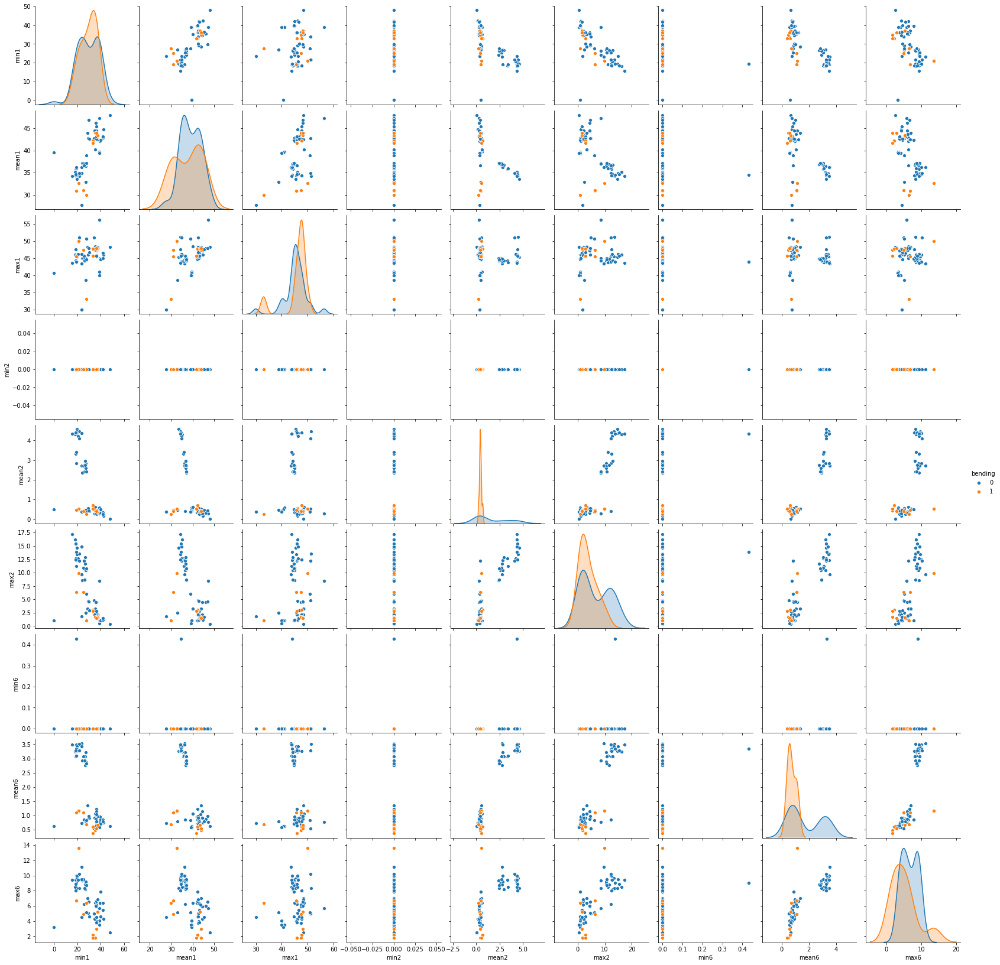

In [10]:
labels = [i.split('/')[3] for i in files_list]
df_c_ii['label'] = labels
bending = []

for i in labels:
    if i == 'bending1' or i  == 'bending2':
        bending.append(1)
    else:
        bending.append(0)
        
df_c_ii['bending'] = bending
selected_data = df_c_ii[df_c_ii.train_test == 'train'][selected_features + ['bending']].reset_index(drop = True)
sns.pairplot(selected_data, hue = 'bending')
plt.show()

### (d)(ii)Break each time series in your training set into two (approximately) equal length time series. Repeat the experiment in 1(d)i,

In [11]:
second_file = pd.read_csv(files_list[0], skiprows = 4, usecols = [1,2,3,4,5,6])
second_file1 = pd.concat([second_file[:240].reset_index(drop=True), second_file[240:].reset_index(drop=True)], axis=1)

In [12]:
col_names2 = []
for i in range(1,13):
    col_names2.append('min'+ str(i))
    col_names2.append('max'+ str(i))
    col_names2.append('mean'+ str(i))
    col_names2.append('median'+ str(i))
    col_names2.append('std'+ str(i))
    col_names2.append('1st_quart'+ str(i))
    col_names2.append('3rd_quart'+ str(i))

In [13]:
second_file1.describe()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000
mean,40.946958,0.375667,17.672583,0.588625,34.504208,0.589000,40.302625,0.341542,20.409292,1.076458,34.118375,0.552167
std,1.102963,0.328089,4.063161,0.817856,1.212039,0.647856,1.716686,0.316790,4.432775,1.039480,2.838110,0.510494
min,38.000000,0.000000,4.000000,0.000000,32.500000,0.000000,37.250000,0.000000,8.000000,0.000000,27.250000,0.000000
25%,40.310000,0.000000,15.937500,0.000000,33.000000,0.000000,39.000000,0.000000,17.750000,0.430000,31.310000,0.000000
50%,41.250000,0.470000,18.000000,0.430000,34.500000,0.000000,39.415000,0.430000,21.500000,0.820000,35.415000,0.430000
75%,42.000000,0.500000,20.250000,0.822500,36.000000,1.300000,42.000000,0.500000,24.000000,1.425000,36.500000,0.940000
max,42.330000,1.220000,25.670000,7.230000,36.170000,1.500000,45.000000,1.300000,29.500000,5.500000,38.250000,1.920000


In [14]:
df_d_ii = pd.DataFrame(columns = col_names2)
for fileloc in files_list:
    file = pd.read_csv(fileloc, skiprows = 4, usecols = [1,2,3,4,5,6])
    file2 = pd.concat([file[:240].reset_index(drop=True), file[240:].reset_index(drop=True)], axis=1)
    stats = file2.describe()
    stats.columns = [1,2,3,4,5,6,7,8,9,10,11,12]
    row = []
    for i in range(1,13):
        row.append(stats[i][3])
        row.append(stats[i][7])
        row.append(stats[i][1])
        row.append(stats[i][5])
        row.append(stats[i][2])
        row.append(stats[i][4])
        row.append(stats[i][6])
    dfrow = pd.DataFrame(row).to_numpy().reshape(1, 84)
    df_d_ii = df_d_ii.append(pd.DataFrame(dfrow, columns = col_names2)).reset_index(drop = True)
df_d_ii['bending'] = bending
df_d_ii['train_test'] = train_test
df_d_ii

,min1,max1,mean1,median1,std1,1st_quart1,3rd_quart1,min2,max2,mean2,...,3rd_quart11,min12,max12,mean12,median12,std12,1st_quart12,3rd_quart12,bending,train_test
0,38.00,42.33,40.946958,41.250,1.102963,40.3100,42.0000,0.0,1.22,0.375667,...,36.5000,0.00,1.92,0.552167,0.430,0.510494,0.00,0.9400,1,test
1,41.75,44.25,42.643292,42.500,0.641849,42.0000,43.3300,0.0,0.94,0.355000,...,33.7500,0.00,3.11,0.533583,0.430,0.575061,0.00,0.8700,1,test
2,36.50,46.50,44.057167,44.500,1.556971,43.2500,45.0000,0.0,1.50,0.381042,...,36.2500,0.00,1.50,0.388333,0.000,0.478528,0.00,0.7100,1,train
3,33.75,47.75,43.278875,45.000,3.473355,42.0000,45.2500,0.0,3.00,0.673292,...,33.7500,0.00,2.18,0.586083,0.470,0.491873,0.00,0.8700,1,train
4,33.00,45.75,41.621208,42.330,3.118644,39.6525,44.2500,0.0,2.83,0.623083,...,30.5625,0.00,1.50,0.347500,0.430,0.363144,0.00,0.5000,1,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,22.33,46.00,34.966250,35.500,4.733014,32.0000,38.7500,0.0,12.68,4.207958,...,18.5000,0.00,9.39,3.430208,3.350,1.647979,2.17,4.4400,0,train
84,21.50,45.67,34.737042,35.500,4.276717,32.0000,37.7500,0.0,12.21,4.217333,...,18.2500,0.00,10.21,3.225917,3.085,1.665326,2.05,4.3500,0,train
85,18.33,45.00,33.886458,34.375,5.143776,30.4575,37.5000,0.0,12.44,4.332208,...,18.2500,0.00,8.01,3.274750,2.955,1.670593,2.05,4.4375,0,train
86,18.33,44.00,34.836458,35.750,4.869092,32.0000,38.6900,0.0,12.38,4.257750,...,18.2500,0.47,8.84,3.409458,3.110,1.707089,2.17,4.3450,0,train


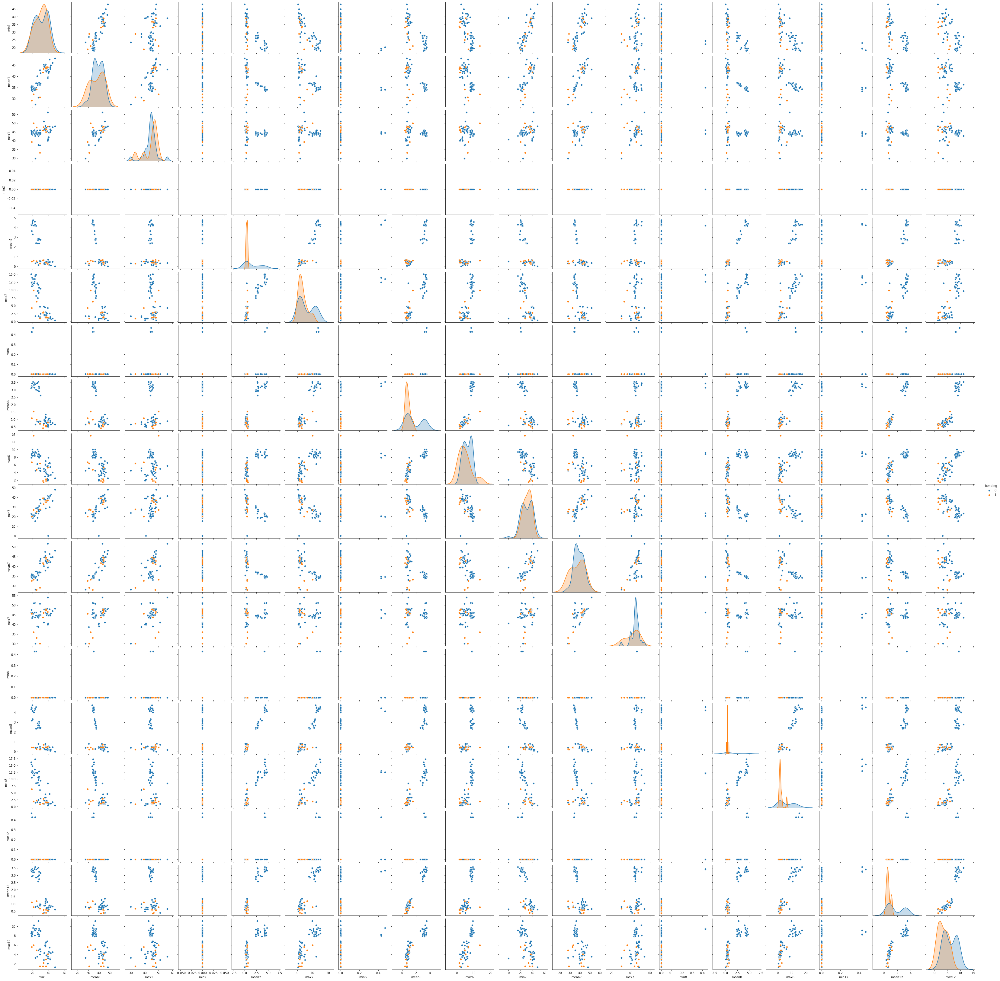

In [15]:
selected_features = [f + str(i) for i in [1,2,6,7,8,12] for f in ['min', 'mean', 'max']]
selected_data = df_d_ii[df_d_ii.train_test == 'train'][selected_features + ['bending']].reset_index(drop = True)
sns.pairplot(selected_data, hue = 'bending')
plt.show()

### According to the two set of graphs, the two distributions are similar to each other.

### (d)(iii). Break each time series in your training set into l ∈ {1, 2, . . . , 20} time series of approximately equal length and use logistic regression to solve the binary classification problem, using time-domain features.

In [16]:
def get_l_time_series(l):
    col_namesl = []
    for i in range(1, 6*l+1):
        col_namesl.append('min'+ str(i))
        col_namesl.append('max'+ str(i))
        col_namesl.append('mean'+ str(i))
        #col_namesl.append('median'+ str(i))
        #col_namesl.append('std'+ str(i))
        #col_namesl.append('1st_quart'+ str(i))
        #col_namesl.append('3rd_quart'+ str(i))

    df_d_iii = pd.DataFrame(columns = col_namesl)
    for fileloc in files_list:
        thefile = pd.read_csv(fileloc, skiprows = 4, usecols = [1,2,3,4,5,6])
        slice_index = range(0, 499, int(np.ceil(480/l)))
        zipped_slice_index = list(zip(slice_index, slice_index[1:]))
        thefile = pd.concat([thefile[x:y].reset_index(drop=True) for x,y in zipped_slice_index], axis=1)
        stats = thefile.describe()
        
        stats_columns = []
        for i in range(1, l*6+1):
            stats_columns.append(i)
        stats.columns = stats_columns
        
        row = []
        for i in range(1, 6*l+1):
            row.append(stats[i][3])
            row.append(stats[i][7])
            row.append(stats[i][1])
            #row.append(stats[i][5])
            #row.append(stats[i][2])
            #row.append(stats[i][4])
            #row.append(stats[i][6])
        dfrow = pd.DataFrame(row).to_numpy().reshape(1, -1)
        df_d_iii = df_d_iii.append(pd.DataFrame(dfrow, columns = col_namesl)).reset_index(drop = True)
        
    df_d_iii['bending'] = bending
    df_d_iii['train_test'] = train_test
    
    #col_num = df_d_iii.shape[1]
    #train = df_d_iii[df_d_iii.train_test == 'train']
    
    #train = train.drop('train_test',1)
    
    #x_train = train.iloc[:, :col_num-2]
    #y_train = train.iloc[:, -1]
    return df_d_iii
    #eturn (x_train, y_train)
    

In [17]:
count_dict = {}
for l in range(1, 21):
    data = get_l_time_series(l)
    col_num = data.shape[1]
    train = data[data.train_test == 'train']
    train = train.drop('train_test',1)
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]
    
    logistic = LogisticRegression(C=10000, solver='lbfgs')
    rfecv = RFECV(logistic, cv=5) 
    selector = rfecv.fit(X_train, y_train)

    count_dict[l] = [selector.support_, sum(selector.support_), max(selector.grid_scores_)]

In [18]:
[count_dict[x][2] for x in range(1,21)]

[1.0,
 0.9857142857142858,
 0.9857142857142858,
 0.9714285714285715,
 0.9571428571428573,
 0.9857142857142858,
 0.9857142857142858,
 0.9560439560439562,
 0.9571428571428573,
 0.9714285714285715,
 0.9857142857142858,
 0.9703296703296704,
 0.9857142857142858,
 0.9857142857142858,
 0.9703296703296704,
 0.9846153846153847,
 0.9703296703296704,
 0.9857142857142858,
 1.0,
 0.9846153846153847]

In [19]:
count_dict[1][1]

6

In [20]:
data = get_l_time_series(1)
col_num = data.shape[1]
train = data[data.train_test == 'train']
train = train.drop('train_test',1)
X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]
#X_train.columns[count_dict[1][0]]
select_features = list(X_train.columns[count_dict[1][0]])
select_features

['mean1', 'max2', 'mean3', 'min5', 'max5', 'mean5']

### The wrong way is to choose a specific l and then perform cross validation. The right way is to using cross-validation to choose the best (l,p)
### The best classifier (l,p) = (1,6). The parameters are mean1, max2, mean3, min5, max5, mean5

### (d)(iv) Report the confusion matrix, show ROC and AUC. Report the parameters of your logistic regression βi’s as well as the p-values associated with them.

In [21]:
data_d_iv = get_l_time_series(1)
col_num = data_d_iv.shape[1]
train = data_d_iv[data_d_iv.train_test == 'train']
test = data_d_iv[data_d_iv.train_test == 'test']
train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]
logistic = LogisticRegression(C=10000, solver='lbfgs', warm_start=True)
rfecv = RFECV(logistic, cv=5)
selector = rfecv.fit(X_train, y_train)
y_train_pre = selector.predict(X_train)
y_test_pre = selector.predict(X_test)
confusion_matrix(y_train, y_train_pre)

array([[60,  0],
       [ 0,  9]])

### There are 60 True negatievs and 9 true positives

In [22]:
trainX_const = sm.add_constant(X_train.loc[:, select_features].to_numpy(dtype=float))
model = sm.Logit(y_train.to_numpy(dtype=float), trainX_const)
logitres = model.fit(method='bfgs')

print(logitres.summary())

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 26
         Function evaluations: 29
         Gradient evaluations: 29
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   69
Model:                          Logit   Df Residuals:                       62
Method:                           MLE   Df Model:                            6
Date:                Fri, 08 Oct 2021   Pseudo R-squ.:                   1.000
Time:                        21:51:59   Log-Likelihood:            -1.6050e-05
converged:                       True   LL-Null:                       -26.718
Covariance Type:            nonrobust   LLR p-value:                 9.588e-10
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.1539   8.78e+05  -1.3

### logistic regression βi’s as well as the p-values associated with them are showed above

In [23]:
y_train_proba = selector.predict_proba(X_train)
y_train_proba_pos = [x[1] for x in y_train_proba]
fpr, tpr, _ = roc_curve(y_train, y_train_proba_pos, pos_label=1)

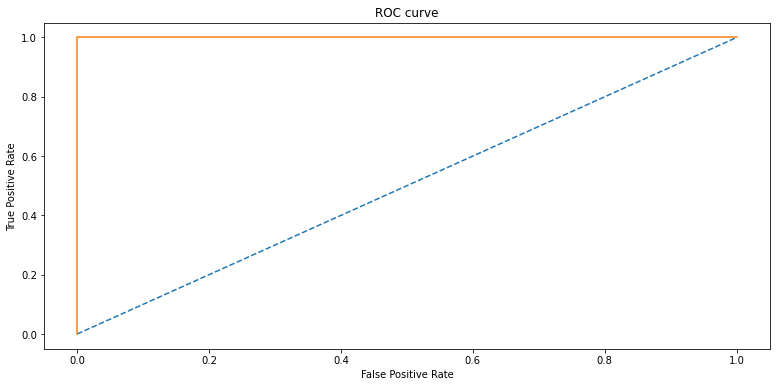

In [24]:
fig, axes = plt.subplots(figsize = (13, 6))
roc_auc = auc(fpr, tpr)
axes.plot([0, 1], [0, 1], "--")
axes.plot(fpr, tpr)
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.set_title("ROC curve")
plt.show()

In [25]:
roc_auc_score(y_train, y_train_proba_pos)

1.0

### The AUC is 1

### (d)(v)Test the classifier on the test set.

In [26]:
y_test_proba = selector.predict_proba(X_test)
y_test_proba_pos = [x[1] for x in y_test_proba]
fpr1, tpr1, _ = roc_curve(y_test, y_test_proba_pos, pos_label=1)
confusion_matrix(y_test, y_test_pre)

array([[15,  0],
       [ 0,  4]])

There are 15 true negatives and 4 true positives

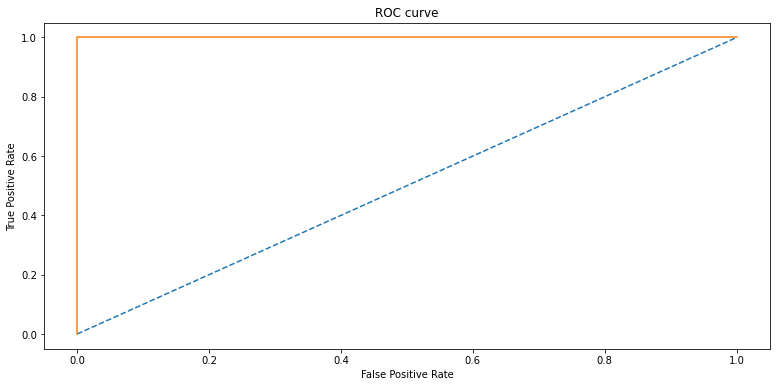

In [27]:
fig, axes = plt.subplots(figsize = (13, 6))
roc_auc = auc(fpr1, tpr1)
axes.plot([0, 1], [0, 1], "--")
axes.plot(fpr, tpr)
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.set_title("ROC curve")
plt.show()

### The accuracy of both the training set and the test set is 1.

### (d)(vi)Do your classes seem to be well-separated to cause instability in calculating logistic regression parameters?

### Yes. There is a statement under the statmodels：

### Complete Separation: The results show that there iscomplete separation. In this case the Maximum Likelihood Estimator does not exist and the parameters are not identified.

### (d)(vii) From the confusion matrices you obtained, do you see imbalanced classes? If yes, build a logistic regression model based on case-control sampling and adjust its parameters. Report the confusion matrix, ROC, and AUC of the model.

### There are imbalanced classes.

In [28]:
#train class has 69 rows, in which 9 are bending and 60 are not bending
#need to reduce not bending size 60 --> 27
count_dict2 = {}
for l in range(1, 21):
    data = get_l_time_series(l)
    col_num = data.shape[1]
    train = data[data.train_test == 'train'][:-33]
    train = train.drop('train_test',1)
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]
    
    logistic = LogisticRegression(C=10000, solver='lbfgs')
    rfecv = RFECV(logistic, cv=5) 
    selector = rfecv.fit(X_train, y_train)

    count_dict2[l] = [selector.support_, sum(selector.support_), max(selector.grid_scores_)]

In [29]:
[count_dict[x][2] for x in range(1,21)]

[1.0,
 0.9857142857142858,
 0.9857142857142858,
 0.9714285714285715,
 0.9571428571428573,
 0.9857142857142858,
 0.9857142857142858,
 0.9560439560439562,
 0.9571428571428573,
 0.9714285714285715,
 0.9857142857142858,
 0.9703296703296704,
 0.9857142857142858,
 0.9857142857142858,
 0.9703296703296704,
 0.9846153846153847,
 0.9703296703296704,
 0.9857142857142858,
 1.0,
 0.9846153846153847]

In [30]:
count_dict[1][1]

6

In [31]:
data = get_l_time_series(1)
col_num = data.shape[1]
train = data[data.train_test == 'train']
train = train.drop('train_test',1)
X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]
#X_train.columns[count_dict[1][0]]
select_features = list(X_train.columns[count_dict[1][0]])
select_features

['mean1', 'max2', 'mean3', 'min5', 'max5', 'mean5']

In [32]:
data2 = get_l_time_series(1)
col_num = data2.shape[1]
train = data2[data2.train_test == 'train'][:-33]
test = data2[data2.train_test == 'test']
train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]
logistic = LogisticRegression(C=10000, solver='lbfgs', warm_start=True)
rfecv = RFECV(logistic, cv=5)
selector = rfecv.fit(X_train, y_train)
y_train_pre = selector.predict(X_train)
y_test_pre = selector.predict(X_test)
confusion_matrix(y_test, y_test_pre)

array([[15,  0],
       [ 0,  4]])

### There are 4 true positives and 15 true negatives

In [33]:
y_test_proba = selector.predict_proba(X_test)
y_test_proba_pos = [x[1] for x in y_test_proba]
fpr, tpr, _ = roc_curve(y_test, y_test_proba_pos, pos_label=1)

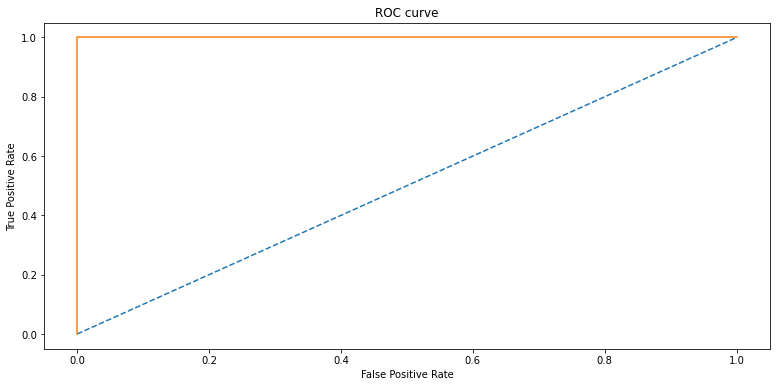

In [34]:
fig, axes = plt.subplots(figsize = (13, 6))
roc_auc = auc(fpr1, tpr1)
axes.plot([0, 1], [0, 1], "--")
axes.plot(fpr, tpr)
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.set_title("ROC curve")
plt.show()

In [35]:
roc_auc_score(y_test, y_test_proba_pos)

1.0

### The auc is 1.

### (e)(i) Repeat 1(d)iii using L1-penalized logistic regression  

In [36]:
C_best = [] #
CV_best = []
for l in range(1, 21):
    data = get_l_time_series(l)
    col_num = data.shape[1]
    train = data[data.train_test == 'train']
    test = data2[data2.train_test == 'test']
    train = train.drop('train_test',1)
    test = test.drop('train_test',1)
    scaler = MinMaxScaler()
    train= scaler.fit_transform(train) 
    test = scaler.fit_transform(test)
    
    train = pd.DataFrame(train)
    test = pd.DataFrame(test)
    
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]

    X_test = test.iloc[:, :col_num-2]
    y_test = test.iloc[:, -1]
    
    logregcv = LogisticRegressionCV(Cs=np.logspace(-1, 1, 100), 
                                    cv=5,
                                    penalty='l1', 
                                    solver='saga', 
                                    n_jobs=-1,
                                    class_weight='balanced',
                                    max_iter=10000)
    print(logregcv.fit(X_train, y_train))
    C_index = np.where(logregcv.Cs_ == logregcv.C_)[0][0]
    C_best.append(logregcv.C_[0])
    CV_best.append(np.mean(list(zip(*logregcv.scores_[1]))[C_index]))

LogisticRegressionCV(Cs=array([ 0.1       ,  0.10476158,  0.10974988,  0.1149757 ,  0.12045035,
        0.12618569,  0.13219411,  0.13848864,  0.14508288,  0.15199111,
        0.15922828,  0.16681005,  0.17475284,  0.18307383,  0.19179103,
        0.2009233 ,  0.21049041,  0.22051307,  0.23101297,  0.24201283,
        0.25353645,  0.26560878,  0.27825594,  0.29150531,  0.30538555,
        0.31992671,  0.33516027,  0.35111917,  0.36783798,  0.3853528...
        2.59502421,  2.71858824,  2.84803587,  2.98364724,  3.12571585,
        3.27454916,  3.43046929,  3.59381366,  3.76493581,  3.94420606,
        4.1320124 ,  4.32876128,  4.53487851,  4.75081016,  4.97702356,
        5.21400829,  5.46227722,  5.72236766,  5.9948425 ,  6.28029144,
        6.57933225,  6.8926121 ,  7.22080902,  7.56463328,  7.92482898,
        8.30217568,  8.69749003,  9.11162756,  9.54548457, 10.        ]),
                     class_weight='balanced', cv=5, max_iter=10000, n_jobs=-1,
                     penalty='

LogisticRegressionCV(Cs=array([ 0.1       ,  0.10476158,  0.10974988,  0.1149757 ,  0.12045035,
        0.12618569,  0.13219411,  0.13848864,  0.14508288,  0.15199111,
        0.15922828,  0.16681005,  0.17475284,  0.18307383,  0.19179103,
        0.2009233 ,  0.21049041,  0.22051307,  0.23101297,  0.24201283,
        0.25353645,  0.26560878,  0.27825594,  0.29150531,  0.30538555,
        0.31992671,  0.33516027,  0.35111917,  0.36783798,  0.3853528...
        2.59502421,  2.71858824,  2.84803587,  2.98364724,  3.12571585,
        3.27454916,  3.43046929,  3.59381366,  3.76493581,  3.94420606,
        4.1320124 ,  4.32876128,  4.53487851,  4.75081016,  4.97702356,
        5.21400829,  5.46227722,  5.72236766,  5.9948425 ,  6.28029144,
        6.57933225,  6.8926121 ,  7.22080902,  7.56463328,  7.92482898,
        8.30217568,  8.69749003,  9.11162756,  9.54548457, 10.        ]),
                     class_weight='balanced', cv=5, max_iter=10000, n_jobs=-1,
                     penalty='

LogisticRegressionCV(Cs=array([ 0.1       ,  0.10476158,  0.10974988,  0.1149757 ,  0.12045035,
        0.12618569,  0.13219411,  0.13848864,  0.14508288,  0.15199111,
        0.15922828,  0.16681005,  0.17475284,  0.18307383,  0.19179103,
        0.2009233 ,  0.21049041,  0.22051307,  0.23101297,  0.24201283,
        0.25353645,  0.26560878,  0.27825594,  0.29150531,  0.30538555,
        0.31992671,  0.33516027,  0.35111917,  0.36783798,  0.3853528...
        2.59502421,  2.71858824,  2.84803587,  2.98364724,  3.12571585,
        3.27454916,  3.43046929,  3.59381366,  3.76493581,  3.94420606,
        4.1320124 ,  4.32876128,  4.53487851,  4.75081016,  4.97702356,
        5.21400829,  5.46227722,  5.72236766,  5.9948425 ,  6.28029144,
        6.57933225,  6.8926121 ,  7.22080902,  7.56463328,  7.92482898,
        8.30217568,  8.69749003,  9.11162756,  9.54548457, 10.        ]),
                     class_weight='balanced', cv=5, max_iter=10000, n_jobs=-1,
                     penalty='

In [37]:
CV_best

[0.9714285714285715,
 0.9714285714285715,
 0.9714285714285715,
 0.9571428571428573,
 0.9428571428571428,
 0.9571428571428571,
 0.9714285714285715,
 0.9560439560439562,
 0.9428571428571428,
 0.9428571428571428,
 0.9417582417582417,
 0.9428571428571428,
 0.9571428571428571,
 0.9714285714285715,
 0.8989010989010989,
 0.9571428571428571,
 0.9428571428571428,
 0.9714285714285715,
 0.9571428571428573,
 0.9571428571428573]

In [38]:
C_best

[0.20092330025650468,
 0.22051307399030456,
 0.9770099572992254,
 6.892612104349698,
 0.4430621457583881,
 0.2535364493970112,
 0.40370172585965547,
 0.4430621457583881,
 0.533669923120631,
 0.5590810182512224,
 0.35111917342151316,
 2.3644894126454084,
 0.5857020818056667,
 0.22051307399030456,
 0.5094138014816381,
 0.38535285937105296,
 0.30538555088334157,
 0.4430621457583881,
 0.2104904144512021,
 0.2104904144512021]

### The best (I, C) is (1, 0.20092330025650468)

### (e)(ii) Compare the L1-penalized with variable selection using p-values. Which one performs better? Which one is easier to implement?

In [39]:
data_e_ii = get_l_time_series(1)
col_num = data_d_iv.shape[1]
train = data_e_ii[data_e_ii.train_test == 'train']
test = data_e_ii[data_e_ii.train_test == 'test']
train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]

logisticeii = LogisticRegression(C=0.20092330025650468, 
                                          penalty='l1', 
                                           solver='saga',
                                           class_weight='balanced',
                                           n_jobs=-1,
                                           max_iter=10000)
print(logisticeii.fit(X_train, y_train))
#rfecv = RFECV(logistic, cv=5)
#selector = rfecv.fit(X_train, y_train)
#y_train_pre = selector.predict(X_train)
#y_test_pre = selector.predict(X_test)
#confusion_matrix(y_train, y_train_pre)

LogisticRegression(C=0.20092330025650468, class_weight='balanced',
                   max_iter=10000, n_jobs=-1, penalty='l1', solver='saga')


In [40]:
logisticeii.score(X_test, y_test)

1.0

In [41]:
confusion_matrix(y_test, logisticeii.predict(X_test))

array([[15,  0],
       [ 0,  4]])

### P-values have not been used to perform variable selection. However, we can very much treat as if our backward selection used p-values as variables-in and variable-out criteria. In L-1 regularized logistic regression, the accuracy is 1. It's the same as the accuracy we obtained previously through variable selection using p-values. The L-1 regularization is easier to implement because we don't need to do intensive computation on every p-values.

### (f)(i) Find the best l in the same way as you found it in 1(e)i to build an L1- penalized multinomial regression model to classify all activities in your train- ing set.10 Report your test error.

In [42]:
best_C = []
best_cv_score = []
labels_new = []
for i in labels:
    if i == 'bending1' or i  == 'bending2':
        labels_new.append('bending')
    else:
        labels_new.append(i)
for l in range(1, 21):
    data = get_l_time_series(l)
    data = data.drop('bending',1)
    
    data['label'] = labels_new
    col_num = data.shape[1]
    train = data[data.train_test == 'train']
    train = train.drop('train_test',1)
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]
    
    logregcv_mc = LogisticRegressionCV(Cs=np.logspace(-1, 1, 100), 
                                       cv=5,
                                       penalty='l1', 
                                       solver='saga', 
                                       multi_class='auto', # Multiclass classification
                                       n_jobs=-1,
                                       max_iter=10000)
    logregcv_mc.fit(X_train, y_train)
    C_index = np.where(logregcv_mc.Cs_ == logregcv_mc.C_[0])[0][0]
    best_C.append(logregcv_mc.C_[0])
    best_cv_score.append(np.mean(list(zip(*logregcv_mc.scores_['bending']))[C_index]))

In [43]:
best_cv_score

[0.8549450549450549,
 0.7978021978021979,
 0.754945054945055,
 0.754945054945055,
 0.7692307692307693,
 0.7681318681318682,
 0.754945054945055,
 0.7538461538461538,
 0.754945054945055,
 0.7263736263736263,
 0.710989010989011,
 0.7703296703296703,
 0.7406593406593407,
 0.7406593406593407,
 0.7252747252747253,
 0.7263736263736263,
 0.7098901098901098,
 0.7384615384615385,
 0.7384615384615385,
 0.798901098901099]

In [44]:
best_C

[0.35111917342151316,
 2.7185882427329413,
 0.18307382802953684,
 0.464158883361278,
 2.3644894126454084,
 3.4304692863149193,
 4.750810162102798,
 4.750810162102798,
 0.14508287784959398,
 4.132012400115339,
 2.4770763559917115,
 2.1544346900318843,
 0.9326033468832199,
 0.17475284000076838,
 0.739072203352578,
 1.0235310218990263,
 0.12618568830660204,
 2.4770763559917115,
 4.5348785081285845,
 0.17475284000076838]

### l = 1 is the best fitting. C = 0.35111917342151316

In [45]:
data = get_l_time_series(2)
data = data.drop('bending',1)
    
data['label'] = labels_new
col_num = data.shape[1]
train = data[data.train_test == 'train']
test = data[data.train_test == 'test']

train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]

logisticfi = LogisticRegression(C=0.35111917342151316, 
                                          penalty='l1', 
                                           solver='saga',
                                           class_weight='balanced',
                                           n_jobs=-1,
                                           max_iter=10000)
print(logisticfi.fit(X_train, y_train))

LogisticRegression(C=0.35111917342151316, class_weight='balanced',
                   max_iter=10000, n_jobs=-1, penalty='l1', solver='saga')


In [46]:
accuracy_score = logisticfi.score(X_test, y_test)
accuracy_score

0.8421052631578947

In [47]:
test_error = 1 - logisticfi.score(X_test, y_test)
test_error

0.1578947368421053

### The accuracy score is 0.842 and the test error is 0.158

In [48]:
y_pred = logisticfi.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[3, 1, 0, 0, 0, 0],
       [0, 2, 0, 0, 0, 1],
       [0, 0, 3, 0, 0, 0],
       [0, 0, 0, 3, 0, 0],
       [0, 0, 1, 0, 2, 0],
       [0, 0, 0, 0, 0, 3]])

### The number on te diagonal represents true predictions. Other numsers represents false predictions

In [49]:
y_test_proba = logisticfi.predict_proba(X_test)
#y_test_proba_pos = [x[1] for x in y_test_proba]
#fpr, tpr, _ = roc_curve(y_test, y_test_proba_pos, pos_label=1)

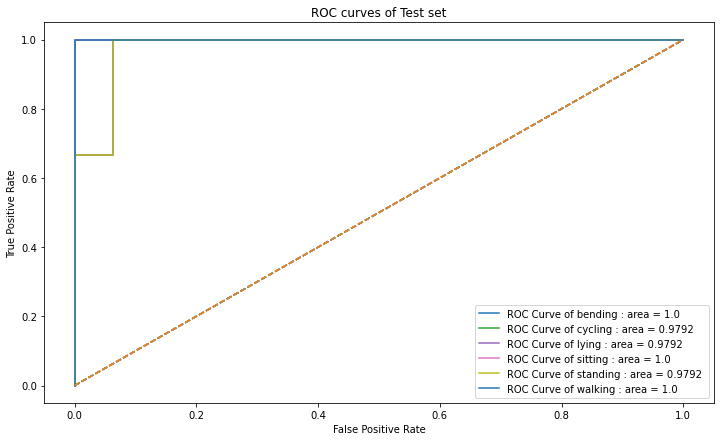

In [50]:
fig, axes = plt.subplots(figsize=(12, 7))
for i, c in enumerate(logisticfi.classes_):
    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba[:, i], pos_label=c)
    roc_auc = auc(fpr, tpr)
    axes.plot(fpr, tpr, label="ROC Curve of {} : area = {} ".format(c, round(roc_auc, 4)))
    axes.plot([0, 1], [0, 1], "--")
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.legend()
axes.set_title("ROC curves of Test set")
plt.show()

### (f)(ii)Repeat 1(f)i using a Na ̈ıve Bayes’ classifier. Use both Gaussian and Multi-nomial priors and compare the results.

In [51]:
score = []
for l in range(1, 21):
    data = get_l_time_series(l)
    data = data.drop('bending',1)
    
    data['label'] = labels_new
    col_num = data.shape[1]
    train = data[data.train_test == 'train']
    train = train.drop('train_test',1)
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]
    
    gnb = GaussianNB()
    score.append(cross_val_score(gnb, X_train, y_train, cv=5, n_jobs=-1))

In [52]:
list(map(np.mean, score))

[0.8274725274725275,
 0.8846153846153847,
 0.7824175824175824,
 0.7824175824175824,
 0.7527472527472527,
 0.7252747252747251,
 0.7527472527472527,
 0.7681318681318681,
 0.6648351648351648,
 0.6648351648351648,
 0.7252747252747251,
 0.6395604395604396,
 0.6549450549450551,
 0.6241758241758241,
 0.5945054945054945,
 0.6516483516483517,
 0.5956043956043956,
 0.5648351648351648,
 0.5945054945054945,
 0.6098901098901098]

### The best l is 2

In [53]:
data = get_l_time_series(2)
data = data.drop('bending',1)
    
data['label'] = labels_new
col_num = data.shape[1]
train = data[data.train_test == 'train']
test = data[data.train_test == 'test']

train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]


gnb = GaussianNB()
gnb.fit(X_train, y_train)
gnb.score(X_test, y_test)

0.9473684210526315

### GNB produces a test accuracy score of 0.9473684210526315

In [54]:
y_pred = gnb.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[4, 0, 0, 0, 0, 0],
       [0, 3, 0, 0, 0, 0],
       [0, 0, 3, 0, 0, 0],
       [0, 0, 0, 3, 0, 0],
       [0, 0, 0, 1, 2, 0],
       [0, 0, 0, 0, 0, 3]])

### The number on te diagonal represents true predictions. Other numsers represents false predictions

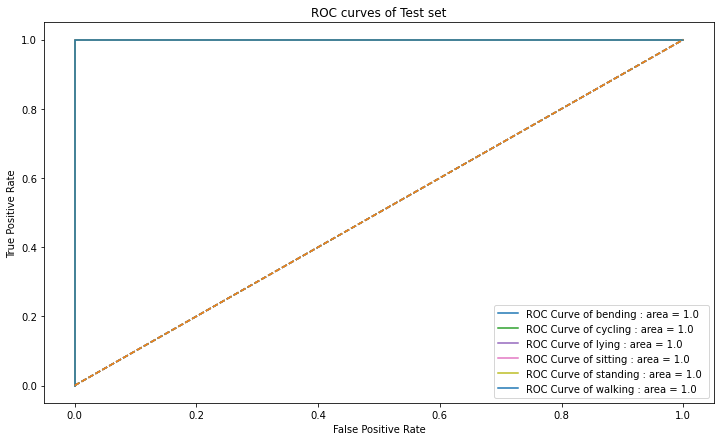

In [55]:
y_test_proba = gnb.predict_proba(X_test)
fig, axes = plt.subplots(figsize=(12, 7))
for i, c in enumerate(gnb.classes_):
    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba[:, i], pos_label=c)
    roc_auc = auc(fpr, tpr)
    axes.plot(fpr, tpr, label="ROC Curve of {} : area = {} ".format(c, round(roc_auc, 4)))
    axes.plot([0, 1], [0, 1], "--")
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.legend()
axes.set_title("ROC curves of Test set")
plt.show()


In [56]:
params = {'alpha': np.logspace(-2, 2, 100)}

best_score = []
best_param = []
for l in range(1, 21):
    data = get_l_time_series(l)
    data = data.drop('bending',1)
    
    data['label'] = labels_new
    col_num = data.shape[1]
    train = data[data.train_test == 'train']
    train = train.drop('train_test',1)
    X_train = train.iloc[:, :col_num-2]
    y_train = train.iloc[:, -1]
    
    mnb = MultinomialNB()
    mnb_cv = GridSearchCV(estimator=mnb,
                          param_grid=params,
                          cv=5, n_jobs=-1, iid=False)
    mnb_cv.fit(X_train, y_train)
    best_score.append(mnb_cv.best_score_)
    best_param.append(mnb_cv.best_params_)

In [57]:
best_score

[0.7835164835164835,
 0.754945054945055,
 0.7824175824175824,
 0.7835164835164835,
 0.8549450549450549,
 0.8263736263736263,
 0.8549450549450549,
 0.8549450549450549,
 0.8109890109890111,
 0.8692307692307691,
 0.8263736263736263,
 0.810989010989011,
 0.8692307692307691,
 0.8252747252747253,
 0.8406593406593406,
 0.8120879120879121,
 0.8252747252747253,
 0.8395604395604396,
 0.8263736263736263,
 0.8120879120879121]

In [58]:
best_param

[{'alpha': 0.25950242113997374},
 {'alpha': 0.7924828983539177},
 {'alpha': 1.5199110829529348},
 {'alpha': 0.01},
 {'alpha': 2.656087782946687},
 {'alpha': 0.23644894126454083},
 {'alpha': 0.13530477745798075},
 {'alpha': 1.5199110829529348},
 {'alpha': 0.3125715849688237},
 {'alpha': 0.13530477745798075},
 {'alpha': 0.01},
 {'alpha': 1.0476157527896652},
 {'alpha': 0.37649358067924693},
 {'alpha': 0.7220809018385468},
 {'alpha': 0.6579332246575682},
 {'alpha': 0.01},
 {'alpha': 0.01},
 {'alpha': 0.01},
 {'alpha': 0.01},
 {'alpha': 0.01}]

### The best l is 5, and the alpha is 2.656087782946687

In [59]:
data = get_l_time_series(5)
data = data.drop('bending',1)
    
data['label'] = labels_new
col_num = data.shape[1]
train = data[data.train_test == 'train']
test = data[data.train_test == 'test']

train = train.drop('train_test',1)
test = test.drop('train_test',1)

X_train = train.iloc[:, :col_num-2]
y_train = train.iloc[:, -1]

X_test = test.iloc[:, :col_num-2]
y_test = test.iloc[:, -1]

mnb = MultinomialNB(alpha=2.656087782946687)
mnb.fit(X_train, y_train)
mnb.score(X_test, y_test)

0.8421052631578947

### MNB produces a test accuracy score of 0.8421052631578947

In [60]:
y_pred = mnb.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[4, 0, 0, 0, 0, 0],
       [0, 3, 0, 0, 0, 0],
       [0, 0, 3, 0, 0, 0],
       [0, 0, 0, 2, 1, 0],
       [0, 0, 1, 1, 1, 0],
       [0, 0, 0, 0, 0, 3]])

### The number on te diagonal represents true predictions. Other numsers represents false predictions

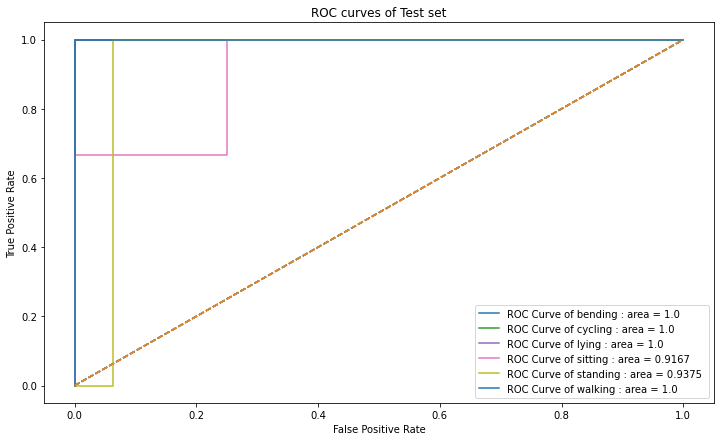

In [61]:
y_test_proba = mnb.predict_proba(X_test)
fig, axes = plt.subplots(figsize=(12, 7))
for i, c in enumerate(mnb.classes_):
    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba[:, i], pos_label=c)
    roc_auc = auc(fpr, tpr)
    axes.plot(fpr, tpr, label="ROC Curve of {} : area = {} ".format(c, round(roc_auc, 4)))
    axes.plot([0, 1], [0, 1], "--")
axes.set_xlabel("False Positive Rate")
axes.set_ylabel("True Positive Rate")
axes.legend()
axes.set_title("ROC curves of Test set")
plt.show()

### (f)(iii)Which method is better for multi-class classification in this problem?

The accuracies of the three models in this problem are as follows:
<br/> Logistic Regression: 0.842105
<br/> Gaussian Naive Bayes 0.947368
<br/> Multinomial Naive Bayes: 0.842105

Gaussian Naive Bayes has the highest accuracy.
From the implementation perspective, Naive Bayes approach is better than Regularized Logistic Regression. We only have 69 instances in the traing set, and Regularized Logistic Regression suffers more from it. On the other hand, Naive Bayes handles the situation well.
In conclusion, Gaussian Naive Bayes is better for multi-class classification and has a best performace in this problem.

### 2. ISLR 3.7.4
<br/> (a) The cubid regression has a lower RSS than linear one beacause more predictors means a better fitting for training data.
<br/> (b) The cubic regression will likely overfits and therefore generalizes poorly on the test set, and hence having a higher test RSS.
<br/> (c) I would expect a lower training RSS for the cubic regression. Because no matter what the underlying true relationshop is the more flexible model will closer follow points and reduce train RSS.
<br/> (d) The infromation is not enough for us to determine the level of flexibility we need in our model. The answer depends on which regression the true relation is closer to.

### 3. ISLR, 4.8.3

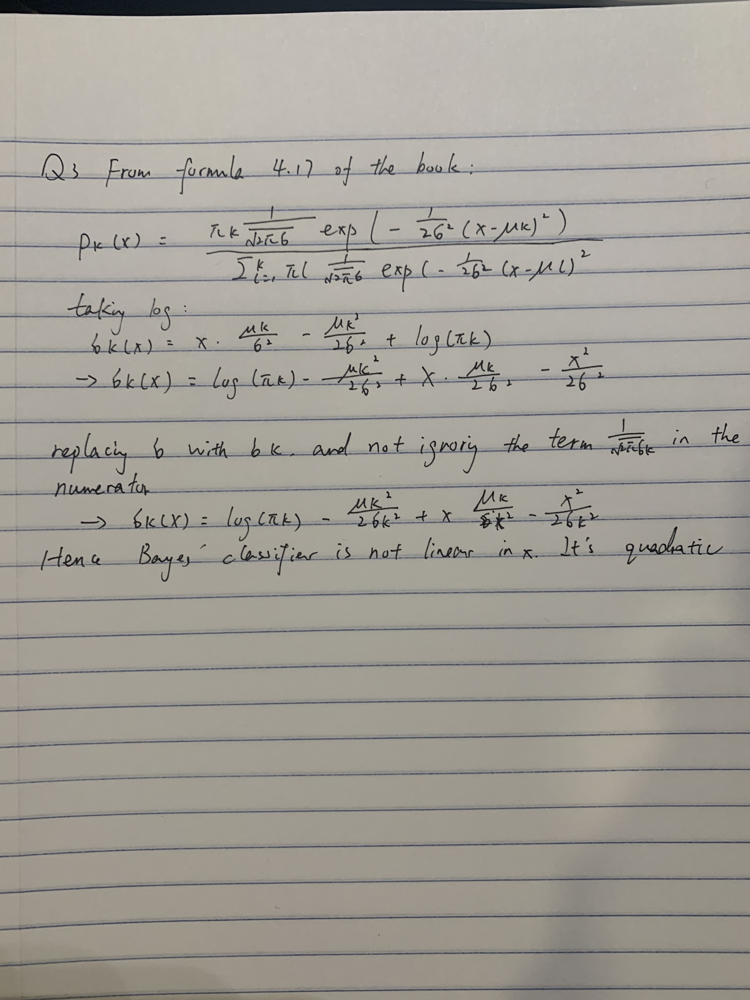

In [65]:
Image('Q3.jpeg')

### 4. ISLR 4.8.7

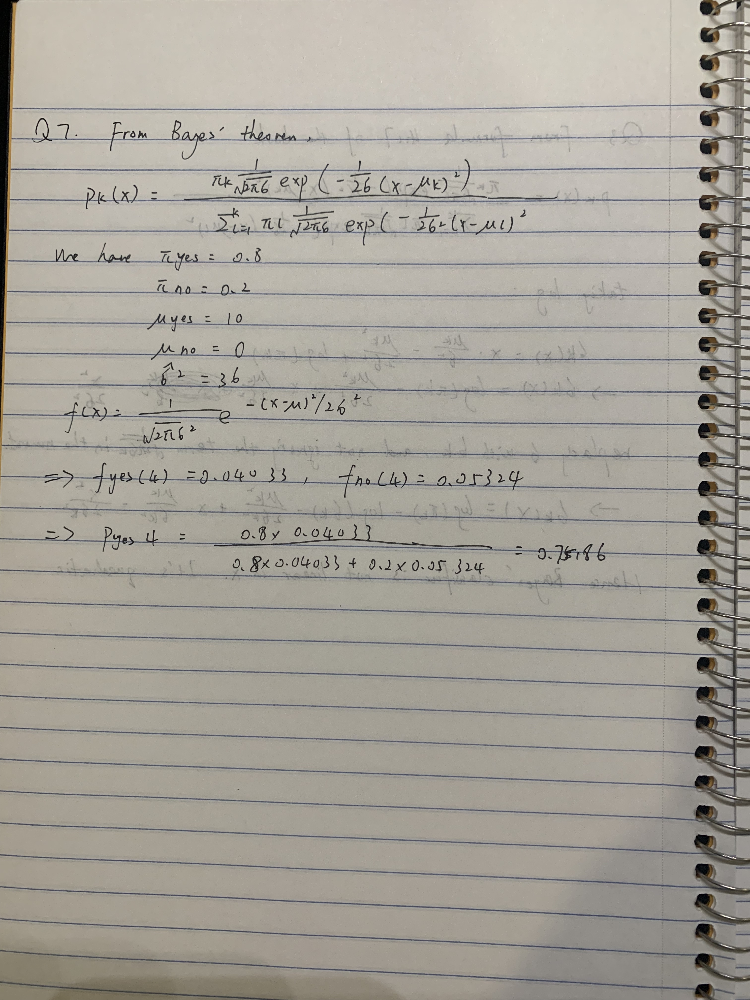

In [63]:
Image('Q7.jpeg')